In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from Visual import MapViser
import seaborn as sns

In [2]:
map_vis = MapViser()

In [3]:
submine_cable = gpd.read_file('./data/geo/submine_cable.shp').to_crs('epsg:4326')
landing_site = gpd.read_file('./data/geo/landing_site.shp').to_crs('epsg:4326')

In [4]:
data_center = gpd.read_file('./data/geo/dc_loc.gpkg')

In [5]:
# 关键参数 lines=True
df = pd.read_csv('./data/net/ipx_loc.csv')


ixp_gdf = gpd.GeoDataFrame(df,geometry=gpd.points_from_xy(x=df['longitude'],y=df['latitude']),crs='epsg:4326')

In [ ]:
desert_solar = pd.read_csv('./data/vre/desert_solar.csv')

desert_solar['gen_poten'] = 1e-3*desert_solar['cap_mid'] * desert_solar['annual_cf'] * 8760

desert_solar = desert_solar.loc[desert_solar['annual_cf']>0]

geo = []

for i,r in desert_solar.iterrows():
    geo.append(Polygon([
        (r['lon'],r['lat']),
        (r['lon']+0.25,r['lat']),
        (r['lon']+0.25,r['lat']-0.25),
        (r['lon'],r['lat']-0.25)
    ]))
    
desert_solar_gdf = gpd.GeoDataFrame(desert_solar,geometry=geo,crs='EPSG:4326')

In [8]:
world_land = gpd.read_file('./data/geo/Base/world_land.shp')
desert = gpd.read_file('./data/geo/desert.shp')

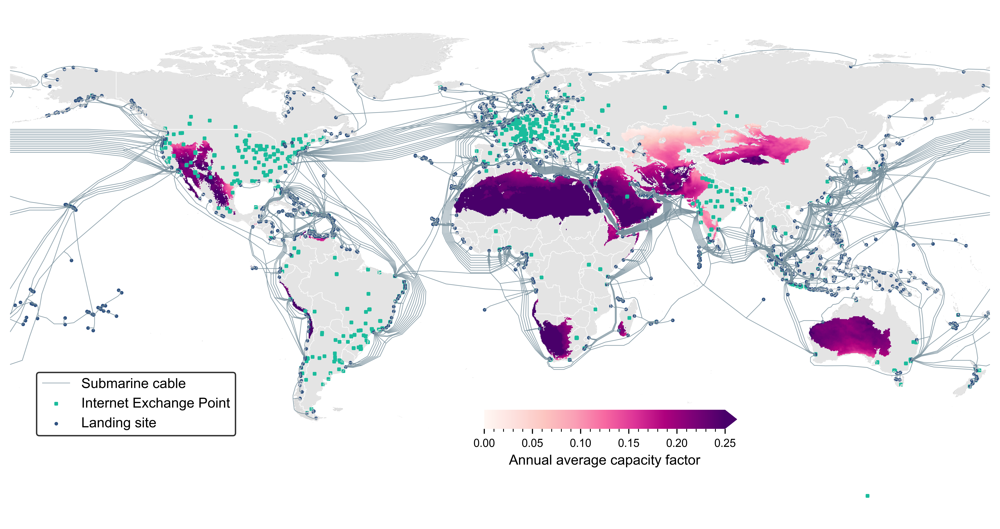

In [32]:

map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='annual_cf',
                                cmap='RdPu',
                                out_fig='./data/fig/Vis/pv_gen_poten.png',
                                cbar_label='Generation potential (TWh/yr)',
                                ub=0.25,
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)

submine_cable.plot(ax=ax,
                   color='#78909C',
                   lw=0.5,
                   alpha=0.8,
                   label='Submarine cable')

ixp_gdf.plot(ax=ax,
             color='#1abc9c',
             marker='s',
             markersize=2.5,
             label='Internet Exchange Point')

landing_site.plot(ax=ax,
                  color='#315381',
                  marker='o',
                  markersize=2.5,
                  label='Landing site')

ax.legend(loc='lower left',edgecolor='black',bbox_to_anchor=(0.02, 0.15))

ax.set_xlim(-180,180)

map_vis.add_colorbar(fig=fig, 
                     loc=[0.5,0.3,0.2,0.0225],
                     vmax=0.25,
                     cmap='RdPu',
                     orientation='horizontal',
                     label='Annual average capacity factor')

plt.savefig('./data/fig/Vis/pv_cf.png',bbox_inches='tight')

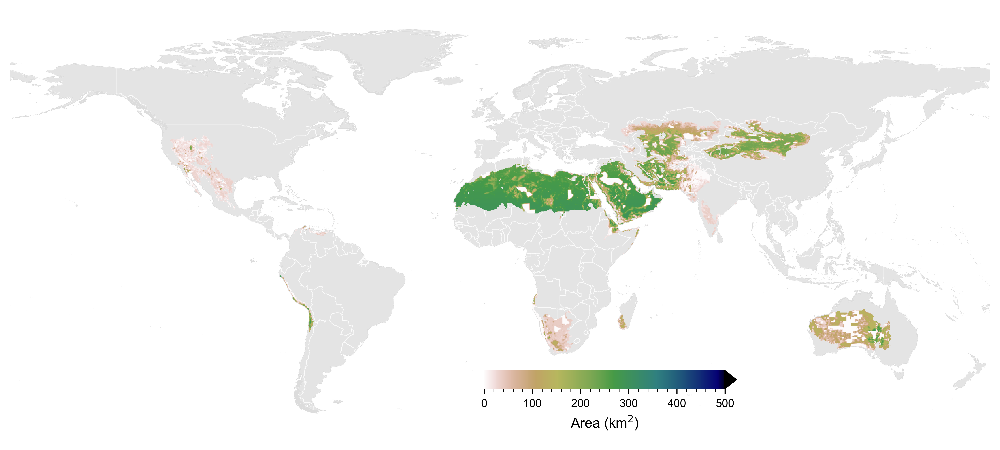

In [21]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='area_mid',
                                cmap='gist_earth_r',
                                ub=500,
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


map_vis.add_colorbar(fig=fig, 
                     loc=[0.5,0.3,0.2,0.0225],
                     vmax=500,
                     cmap='gist_earth_r',
                     orientation='horizontal',
                     label='Area (km$^2$)')

ax.set_xlim(-180,180)

plt.savefig('./data/fig/Vis/pv_area.jpg',bbox_inches='tight')

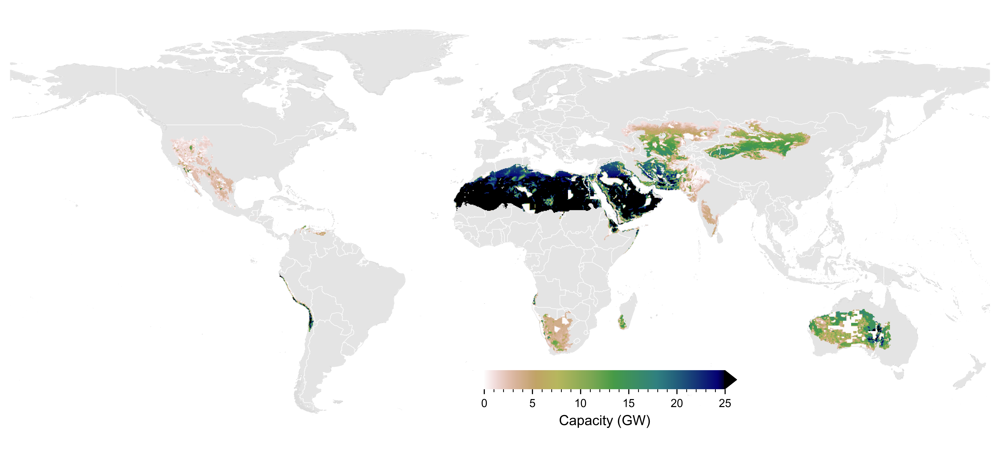

In [23]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='cap_mid',
                                cmap='gist_earth_r',
                                ub=25,
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


map_vis.add_colorbar(fig=fig, 
                     loc=[0.5,0.3,0.2,0.0225],
                     vmax=25,
                     cmap='gist_earth_r',
                     orientation='horizontal',
                     label='Capacity (GW)')

ax.set_xlim(-180,180)

plt.savefig('./data/fig/Vis/pv_cap.jpg',bbox_inches='tight')

In [25]:
desert_solar.shape

(39775, 25)

In [12]:
desert_we = pd.read_csv('./data/vre/desert_we.csv')

desert_we['gen_poten'] = 1e-3*desert_solar['cap_mid'] * desert_solar['annual_cf'] * 8760

desert_we = desert_we.loc[desert_we['annual_cf']>0]

geo = []

for i,r in desert_we.iterrows():
    geo.append(Polygon([
        (r['lon'],r['lat']),
        (r['lon']+0.25,r['lat']),
        (r['lon']+0.25,r['lat']-0.25),
        (r['lon'],r['lat']-0.25)
    ]))
    
desert_we_gdf = gpd.GeoDataFrame(desert_we,geometry=geo,crs='EPSG:4326')

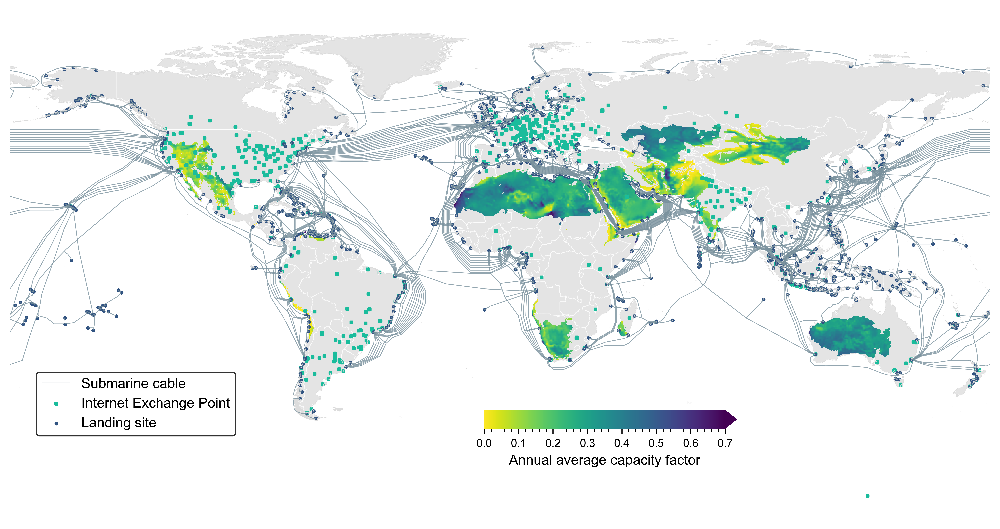

In [34]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_we_gdf,
                                attr_col='annual_cf',
                                cmap='viridis_r',
                                ub=0.7,
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)

submine_cable.plot(ax=ax,
                   color='#78909C',
                   lw=0.5,
                   alpha=0.8,
                   label='Submarine cable')

ixp_gdf.plot(ax=ax,
             color='#1abc9c',
             marker='s',
             markersize=2.5,
             label='Internet Exchange Point')

landing_site.plot(ax=ax,
                  color='#315381',
                  marker='o',
                  markersize=2.5,
                  label='Landing site')

map_vis.add_colorbar(fig=fig, 
                     loc=[0.5,0.3,0.2,0.0225],
                     vmax=0.7,
                     cmap='viridis_r',
                     orientation='horizontal',
                     label='Annual average capacity factor')

ax.legend(loc='lower left',edgecolor='black',bbox_to_anchor=(0.02, 0.15))

ax.set_xlim(-180,180)

plt.savefig('./data/fig/Vis/we_cf.png',bbox_inches='tight')

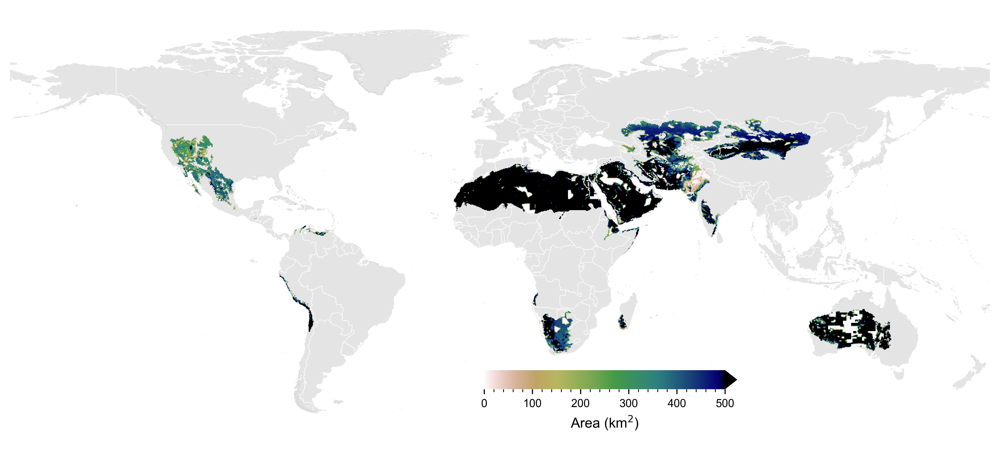

In [16]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_we_gdf,
                                attr_col='area_mid',
                                cmap='gist_earth_r',
                                ub=500,
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


map_vis.add_colorbar(fig=fig, 
                     loc=[0.5,0.3,0.2,0.0225],
                     vmax=500,
                     cmap='gist_earth_r',
                     orientation='horizontal',
                     label='Area (km$^2$)')

ax.set_xlim(-180,180)

plt.savefig('./data/fig/Vis/we_area.jpg',bbox_inches='tight')

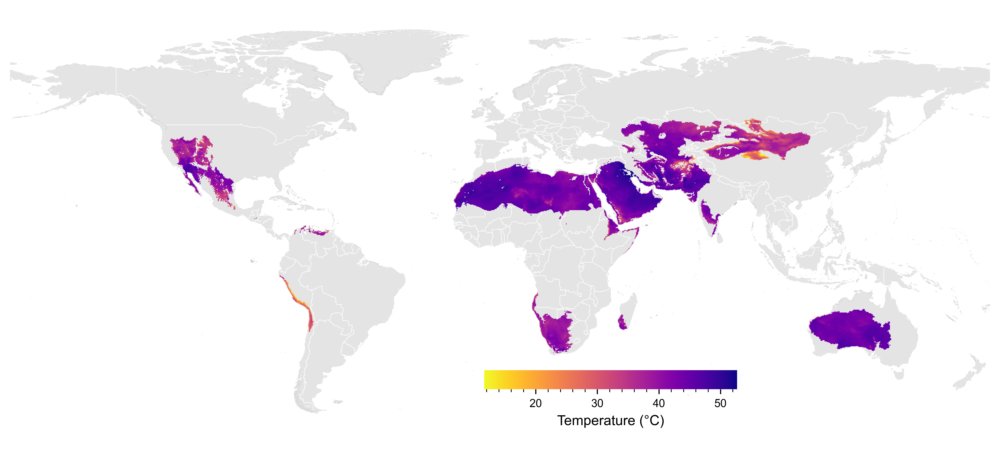

In [18]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='t2m_max',
                                cmap='plasma_r',
                                ub=max(desert_solar_gdf['t2m_max']),
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


map_vis.add_colorbar(fig = fig, 
                     loc = [0.5,0.3,0.2,0.0225],
                     vmax = max(desert_solar_gdf['t2m_max']),
                     vmin = min(desert_solar_gdf['t2m_max']),
                     cmap = 'plasma_r',
                     extend=None,
                     orientation = 'horizontal',
                     label = 'Temperature (°C)')

ax.set_xlim(-180,180)


plt.savefig('./data/fig/Vis/tem_max.png',bbox_inches='tight')


In [20]:
dc_in_desert = gpd.sjoin(left_df=data_center,right_df=desert,predicate='within')

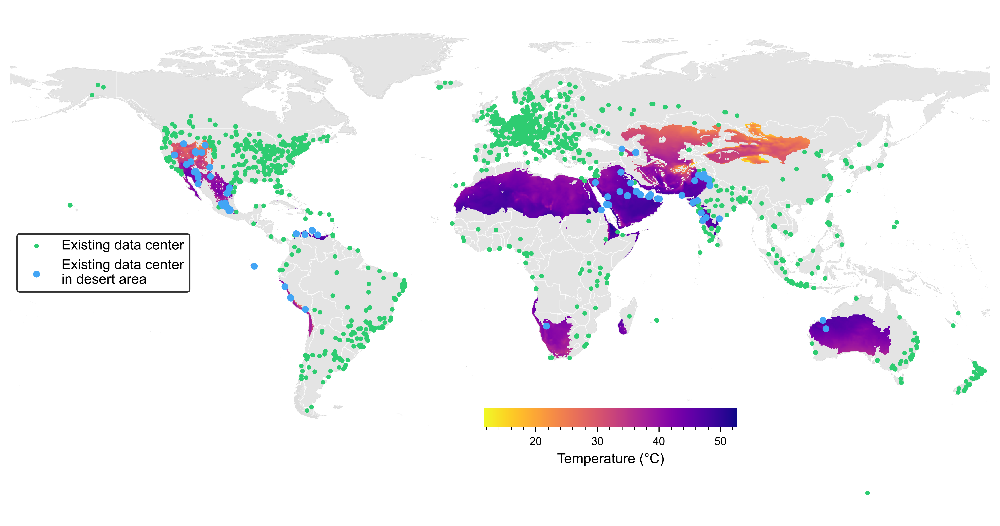

In [21]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='t2m_mean',
                                cmap='plasma_r',
                                ub=max(desert_solar_gdf['t2m_mean']),
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


data_center.plot(ax=ax,
                 color='#2ecc71',
                 markersize=5,
                 zorder=3,
                 label='Existing data center')

dc_in_desert.plot(ax=ax,
                  color='#42A5F5',
                  markersize=15,
                  zorder=3,
                  label='Existing data center\nin desert area')


map_vis.add_colorbar(fig = fig, 
                     loc = [0.5,0.3,0.2,0.0225],
                     vmax = max(desert_solar_gdf['t2m_max']),
                     vmin = min(desert_solar_gdf['t2m_max']),
                     cmap = 'plasma_r',
                     extend=None,
                     orientation = 'horizontal',
                     label = 'Temperature (°C)')

ax.set_xlim(-180,180)

ax.legend(loc='center left',edgecolor='black')

plt.savefig('./data/fig/Vis/tem_mean.png',bbox_inches='tight')


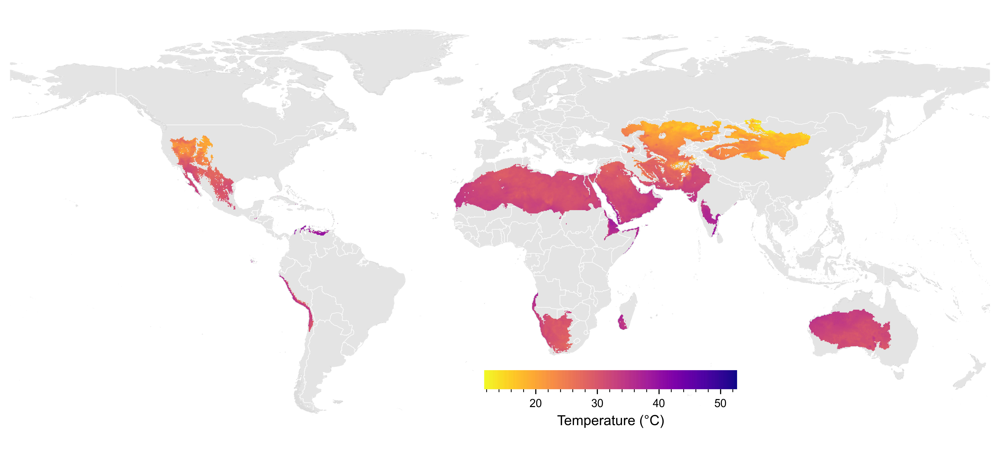

In [22]:
map_vis.set_font()

map_vis.set_bound_color('gainsboro')

fig,ax = map_vis.draw_attr_map(vis_shp=desert_solar_gdf,
                                attr_col='t2m_min',
                                cmap='plasma_r',
                                ub=max(desert_solar_gdf['t2m_max']),
                                with_cbar=False,
                                bound_mode=2,
                                return_fig=True)


map_vis.add_colorbar(fig = fig, 
                     loc = [0.5,0.3,0.2,0.0225],
                     vmax = max(desert_solar_gdf['t2m_max']),
                     vmin = min(desert_solar_gdf['t2m_max']),
                     cmap = 'plasma_r',
                     extend=None,
                     orientation = 'horizontal',
                     label = 'Temperature (°C)')

ax.set_xlim(-180,180)


plt.savefig('./data/fig/Vis/tem_min.png',bbox_inches='tight')
